In [318]:
# Calculate the average trip count per day for each colonia
avg_trip_count_per_colonia_day = benito_juarez_data.groupby(['Colonia', 'Week_Day'])['Trip_Duration'].size().reset_index(name='Trip_Count')

avg_trip_count_per_colonia_day = avg_trip_count_per_colonia_day.groupby(['Colonia', 'Week_Day']).mean().reset_index()

# Sort the data to get the top 10 colonias by average trip count
top_10_colonias = avg_trip_count_per_colonia_day.groupby('Colonia')['Trip_Count'].mean().sort_values(ascending=False).head(10).index

filtered_avg_trip_count = avg_trip_count_per_colonia_day[avg_trip_count_per_colonia_day['Colonia'].isin(top_10_colonias)]

filtered_avg_trip_count

,Colonia,Week_Day,Trip_Count
7,Actipan,Monday,23026.0
8,Actipan,Tuesday,25836.0
9,Actipan,Wednesday,25309.0
10,Actipan,Thursday,24058.0
11,Actipan,Friday,23216.0
...,...,...,...
240,Santa Cruz Atoyac,Wednesday,26497.0
241,Santa Cruz Atoyac,Thursday,25083.0
242,Santa Cruz Atoyac,Friday,24384.0
243,Santa Cruz Atoyac,Saturday,17912.0


In [ ]:
# Create a grouped bar plot for the average trip count for top 10 colonias per day of the week
fig = px.bar(filtered_avg_trip_count, 
             x='Week_Day', 
             y='Trip_Count', 
             color='Colonia', 
             barmode='group',
             title='Average Trip Count for Top 10 Colonias per Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Trip_Count': 'Average Trip Count'},
             height=600, 
             width=1700)

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Average Trip Count',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        x=0.85,
        y=1.03,
        bgcolor='rgba(255, 255, 255, 0.5)',  # Background color with some transparency
        bordercolor='Black',
        borderwidth=2
    )
)

# Show the plot
fig.show()

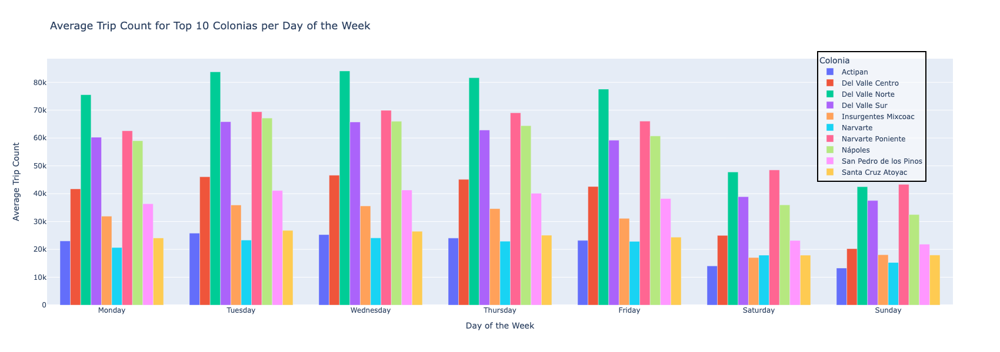

### Del Valle Norte has the highest average trip count from Monday to Friday, followed by Del Valle Sur, Narvarte Poniente, and Napoles.
### Wednesday stands out as the day with the highest number of trips.
### On weekends, Narvarte Poniente leads in trip counts.

In [321]:
# Calculate the average trip duration per day for each colonia
avg_trip_duration_per_colonia_day = benito_juarez_data.groupby(['Colonia', 'Week_Day'])['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')

# Sort the data to get the top 10 colonias by average trip duration
top_10_colonias = avg_trip_duration_per_colonia_day.groupby('Colonia')['Avg_Trip_Duration'].mean().sort_values(ascending=False).head(10).index

# Filter the data to include only the top 10 colonias
filtered_avg_trip_duration = avg_trip_duration_per_colonia_day[avg_trip_duration_per_colonia_day['Colonia'].isin(top_10_colonias)]

filtered_avg_trip_duration

,Colonia,Week_Day,Avg_Trip_Duration
14,Alamos,Monday,16.104347
15,Alamos,Tuesday,16.558982
16,Alamos,Wednesday,16.657712
17,Alamos,Thursday,16.596170
18,Alamos,Friday,16.592580
...,...,...,...
219,San Jose Insurgentes,Wednesday,16.976389
220,San Jose Insurgentes,Thursday,17.099398
221,San Jose Insurgentes,Friday,17.418612
222,San Jose Insurgentes,Saturday,17.003986


In [ ]:
# Create a grouped bar plot for the average trip duration for top 10 colonias per day of the week
fig = px.bar(filtered_avg_trip_duration, 
             x='Week_Day', 
             y='Avg_Trip_Duration', 
             color='Colonia', 
             barmode='group',
             title='Top 10 Colonias with highest Trip Duration per Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Avg_Trip_Duration': 'Average Trip Duration (minutes)'},
             height=600, 
             width=1600)

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Average Trip Duration (minutes)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='h',  # Set legend orientation to horizontal
        yanchor='bottom',
        y=1.02,
        xanchor='right',
        x=1
    )
)

# Show the plot
fig.show()

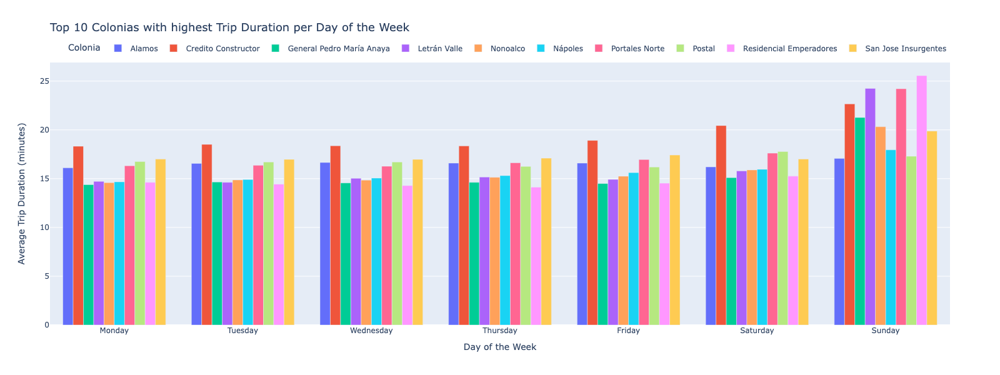

### Residencial emperadores, Portales Norte and Letran Valle show up as the top 3 colonias with the highest trip duration for Sunday
### Credito Constructor maintains consistent durations all week being the top colonia from monday - friday 

In [ ]:
# Generate a color map for the colonias (only those present in the filtered data)
colonias = filtered_avg_trip_duration['Colonia'].unique()
colors = plt.cm.get_cmap('tab20', len(colonias)).colors  # 'tab20' is a colormap with 20 colors
color_map = {colonia: colors[i % 20] for i, colonia in enumerate(colonias)}
color_map_hex = {colonia: mcolors.rgb2hex(color) for colonia, color in color_map.items()}

# Filter the original data to include only the stations in the top colonias
filtered_data = benito_juarez_data[benito_juarez_data['Colonia'].isin(colonias)]

# Group by 'Station_ID' and get unique coordinates for each station in top colonias
station_data = filtered_data.groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude']).size().reset_index(name='Trip_Count')

# Create a Folium map centered at the mean latitude and longitude of the stations
mean_lat_lon = station_data[['Latitude', 'Longitude']].mean()
map_center = [mean_lat_lon['Latitude'], mean_lat_lon['Longitude']]
mymap = folium.Map(location=map_center, zoom_start=14)

# Extract coordinates for all unique stations in Benito Juárez data
coords = benito_juarez_data[['Latitude', 'Longitude']].drop_duplicates().values

# Compute the convex hull for all unique stations
hull = ConvexHull(coords)
hull_coords = [coords[vertex].tolist() for vertex in hull.vertices] + [coords[hull.vertices[0]].tolist()]

# Add a polygon layer for the Benito Juárez boundary
folium.Polygon(
    locations=hull_coords,
    color='blue',
    fill=True,
    fill_opacity=0.2,
    weight=2,
    popup='Benito Juárez Area'
).add_to(mymap)

# Add a marker for each of the stations with color based on Colonia
for idx, row in station_data.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {row['Station_ID']}<br>Colonia: {row['Colonia']}<br>Trip Count: {row['Trip_Count']}",
        icon=folium.Icon(color='blue', icon_color=color_map_hex[row['Colonia']])
    ).add_to(mymap)

# Add a title to the map
title_html = '''
     <div style="position: fixed; 
     top: 10px; left: 60%; transform: translateX(-50%); width: auto; height: auto; 
     background-color: white; z-index:9999; font-size:22px;
     border:2px solid grey; border-radius: 10px; padding: 5px;">
     <b>Top Stations in Colonias with Highest Average Trip Duration in Benito Juárez</b>
     </div>
     '''
mymap.get_root().html.add_child(folium.Element(title_html))

# Create a legend for the colonias (only those present in the map)
legend_html = '''
     <div style="position: absolute; 
     top: 60px; left: 50px; width: 390px; height: auto; 
     background-color: white; z-index:9999; font-size:14px;
     border:2px solid grey; border-radius: 10px; padding: 16px;">
     <b>Colonias</b><br>
     <div style="display: grid; grid-template-columns: repeat(5, 1fr); gap: 5px;">
     '''
for colonia in colonias:
    legend_html += f'<div><i style="background:{color_map_hex[colonia]}; width: 15px; height: 15px; display: inline-block;"></i> {colonia}</div>'
legend_html += '</div></div>'

mymap.get_root().html.add_child(folium.Element(legend_html))

# Display the map
mymap

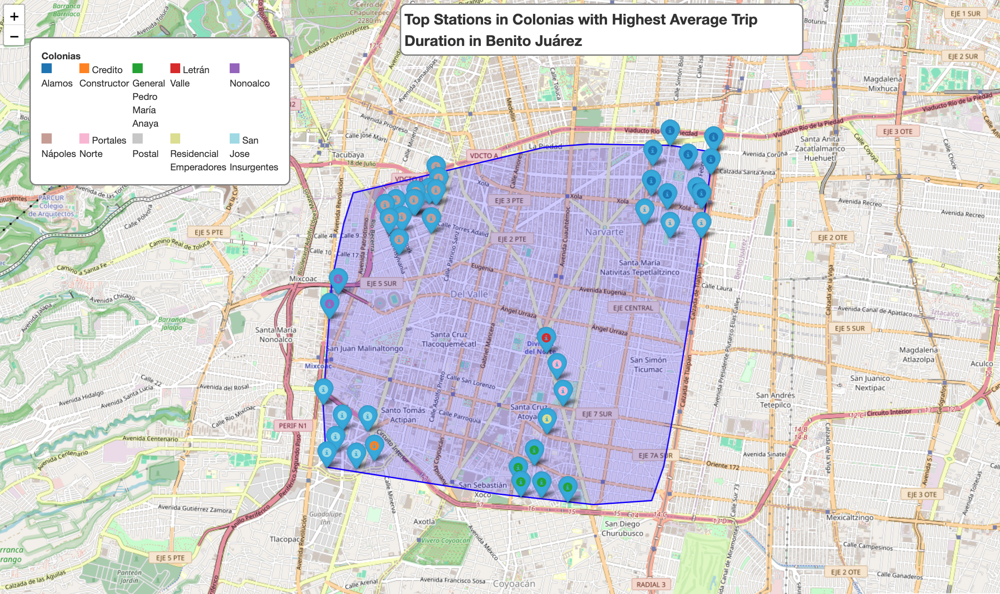

### Colonias with the highest trip durations are predominantly located along the boundaries of the Alcaldía Benito Juárez, with only two situated more centrally.
### The high trip durations are likely influenced by their proximity to major belt lines encircling the Alcaldía, suggesting that commuting through main avenues is more efficient than traveling across the Alcaldía.
### Additionally, many of these colonias are among those with the highest percentages of female users, as noted earlier.
### Further investigation into the demographics of these colonias and stations will be conducted to identify any patterns or trends.

In [ ]:
# Calculate the number of trips made by females and males for each colonia
gender_counts = filtered_data.groupby(['Colonia', 'Gender']).size().reset_index(name='Count')

# Calculate the total number of trips for each colonia
total_counts = gender_counts.groupby('Colonia')['Count'].sum().reset_index(name='Total_Count')

# Merge the gender counts with the total counts to calculate percentages
merged_data = pd.merge(gender_counts, total_counts, on='Colonia')
merged_data['Percentage'] = (merged_data['Count'] / merged_data['Total_Count']) * 100

# Define color mapping for age groups
color_map = {
    'F': 'pink',
    'M': 'blue'
}

# Create a stacked bar chart to show the gender distribution as percentages for each colonia
fig = px.bar(merged_data, 
             x='Colonia', 
             y='Percentage', 
             color='Gender', 
             title='Gender Distribution in Top 10 Colonias by Average Trip Duration',
             labels={'Colonia': 'Colonia', 'Percentage': 'Percentage of Trips'},
             height=600, 
             width=1600,
             barmode='group',
             color_discrete_map=color_map)

fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Percentage of Trips',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='h',  # Set legend orientation to horizontal
        yanchor='bottom',
        y=1.02,
        xanchor='right',
        x=1
    )
)

# Show the plot
fig.show()

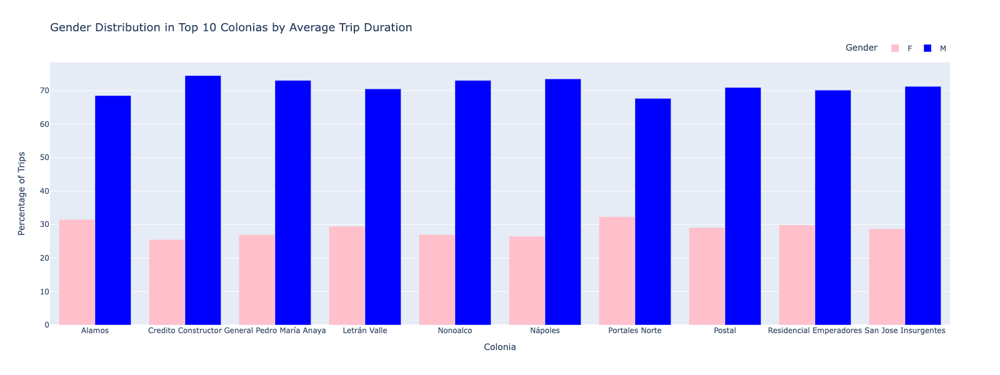

### Credito Constructor is the colonia with the highest trip duration from Monday to Saturday, but it has the lowest percentage of female users at 25.5%. 
### Álamos shows 31% female users and maintains consistently high trip durations throughout the week, although it drops to the lowest average on the weekend. 
### Portales Norte has 32% female users and leads in average trip duration on Sundays, along with Letrán Valle.
### While the data shows that some colonias with lower percentages of female users have higher trip durations, and vice versa, further investigation into the age groups for these 10 colonias is needed.

In [ ]:
# Calculate the number of trips made by each age group for each colonia
age_group_counts = filtered_data.groupby(['Colonia', 'Age_Group']).size().reset_index(name='Count')

# Calculate the total number of trips for each colonia
total_counts = age_group_counts.groupby('Colonia')['Count'].sum().reset_index(name='Total_Count')

# Merge the age group counts with the total counts to calculate percentages
merged_data = pd.merge(age_group_counts, total_counts, on='Colonia')
merged_data['Percentage'] = (merged_data['Count'] / merged_data['Total_Count']) * 100


# Create a stacked bar chart to show the age group distribution as percentages for each colonia
fig = px.bar(merged_data, 
             x='Colonia', 
             y='Percentage', 
             color='Age_Group', 
             title='Age Group Distribution in Top 10 Colonias by Average Trip Duration',
             labels={'Colonia': 'Colonia', 'Percentage': 'Percentage of Trips'},
             height=600, 
             width=1600,
             barmode='stack',
             color_discrete_map=color_map)

fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Percentage of Trips',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='h',  # Set legend orientation to horizontal
        yanchor='bottom',
        y=1.02,
        xanchor='right',
        x=1
    )
)

# Show the plot
fig.show()

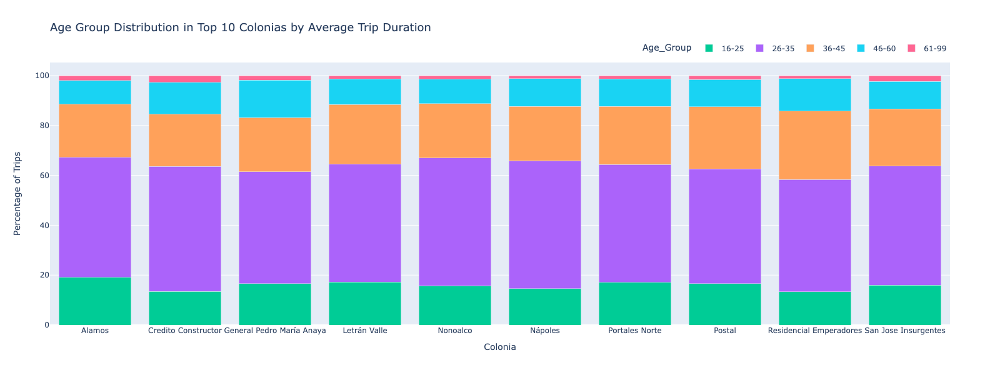

In [ ]:
# Calculate the average trip duration for each age group per day of the week
avg_trip_duration_per_age_group_day = benito_juarez_data.groupby(['Age_Group', 'Week_Day'])['Trip_Duration'].mean().reset_index()

# Create the line chart with Plotly
fig = px.line(avg_trip_duration_per_age_group_day, 
              x='Week_Day', 
              y='Trip_Duration', 
              color='Age_Group', 
              title='Average Trip Duration per Age Group by Day of the Week for Benito Juarez',
              labels={'Week_Day': 'Day of the Week', 'Trip_Duration': 'Average Trip Duration (minutes)'},
              markers=True,
              height=600, 
              width=1700,
              color_discrete_map=color_map)

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Average Trip Duration (minutes)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='h',
        yanchor='bottom',
        y=1.02,
        xanchor='right',
        x=1
    )
)

# Show the plot
fig.show()

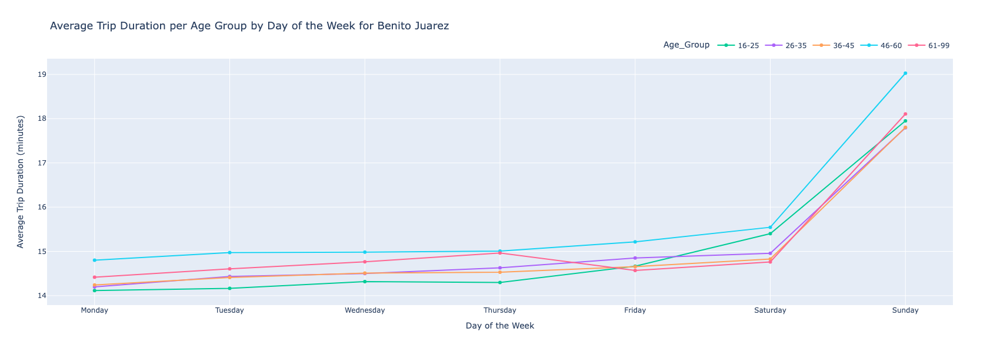

## Age Distribution:
### Credito Constructor has the highest percentage of the 61-99 age group, which is known for longer average trip durations.
### Residencial Emperadores has the highest percentage of the 36-45 age group.
### Weekly data indicates that the 46-60 age group leads in average trip duration every day for Benito Juárez, followed by the 61-99 age group, which drops to the lowest on Fridays and Saturdays.
### Young adults (16-25) have the lowest average trip durations.

In [ ]:
# Filter the data for the age group 46-60
age_group_46_60_data = benito_juarez_data[benito_juarez_data['Age_Group'] == '46-60']

# Calculate the total trips for each colonia per day of the week
total_trips_per_colonia_day = benito_juarez_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Total_Trips')

# Calculate the trips for the age group 46-60 for each colonia per day of the week
age_group_trips_per_colonia_day = age_group_46_60_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Age_Group_Trips')

# Merge the dataframes to get total trips and age group trips together
merged_data = pd.merge(age_group_trips_per_colonia_day, total_trips_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the percentage of trips for the age group 46-60
merged_data['Percentage_Age_Group_46_60'] = (merged_data['Age_Group_Trips'] / merged_data['Total_Trips']) * 100

# Identify the top 10 colonias with the highest percentage for each day
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Percentage_Age_Group_46_60')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Percentage_Age_Group_46_60', 
             color='Colonia', 
             title='Top 10 Colonias with Highest Percentage of Age Group 46-60 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Percentage_Age_Group_46_60': 'Percentage of Age Group 46-60 (%)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Percentage of Age Group 46-60 (%)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

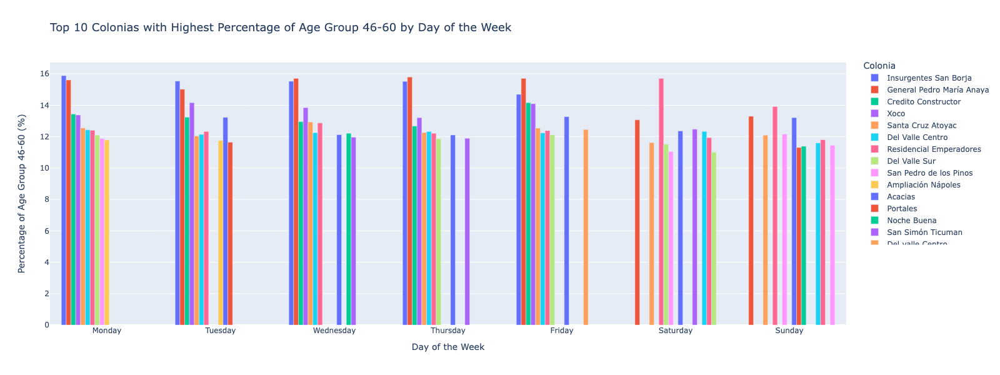

## Weekly Trends age group 46-60:
### Monday to Friday: Notable colonias include Insurgentes San Borja, General Pedro María Anaya, Xoco, and Credito Constructor.
### Weekend: Residencial Emperadores leads in trip duration.

In [ ]:
# Filter the data for the age group 46-60
age_group_26_35_data = benito_juarez_data[benito_juarez_data['Age_Group'] == '26-35']

# Calculate the total trips for each colonia per day of the week
total_trips_per_colonia_day = benito_juarez_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Total_Trips')

# Calculate the trips for the age group 46-60 for each colonia per day of the week
age_group_trips_per_colonia_day = age_group_26_35_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Age_Group_Trips')

# Merge the dataframes to get total trips and age group trips together
merged_data = pd.merge(age_group_trips_per_colonia_day, total_trips_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the percentage of trips for the age group 46-60
merged_data['Percentage_Age_Group_26_35'] = (merged_data['Age_Group_Trips'] / merged_data['Total_Trips']) * 100

# Identify the top 10 colonias with the highest percentage for each day
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Percentage_Age_Group_26_35')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Percentage_Age_Group_26_35', 
             color='Colonia', 
             title='Top 10 Colonias with Highest Percentage of Age Group 26-35 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Percentage_Age_Group_26_35': 'Percentage of Age Group 46-60 (%)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Percentage of Age Group 26-35 (%)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

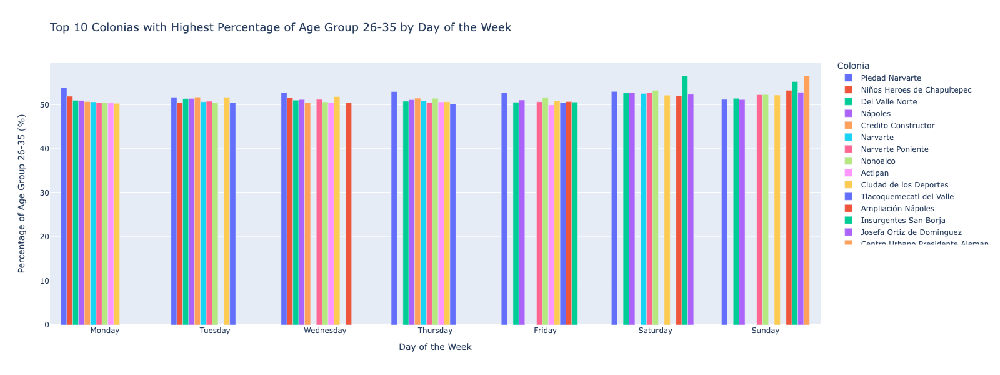

## Since the 26-35 age group constitutes the majority of riders, percentages per colonia are quite close on a weekly level.
## Noteworthy colonias include:
### Pedad Narvarte on Monday with almost 54%.
### San Borja on Saturday with 56%.
### Centro Urbano Presidente Alemán on Sunday with 56.5%.

In [ ]:
# Filter the data for the age group 46-60
age_group_36_45_data = benito_juarez_data[benito_juarez_data['Age_Group'] == '36-45']

# Calculate the total trips for each colonia per day of the week
total_trips_per_colonia_day = benito_juarez_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Total_Trips')

# Calculate the trips for the age group 46-60 for each colonia per day of the week
age_group_trips_per_colonia_day = age_group_36_45_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Age_Group_Trips')

# Merge the dataframes to get total trips and age group trips together
merged_data = pd.merge(age_group_trips_per_colonia_day, total_trips_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the percentage of trips for the age group 46-60
merged_data['Percentage_Age_Group_36_45'] = (merged_data['Age_Group_Trips'] / merged_data['Total_Trips']) * 100

# Identify the top 10 colonias with the highest percentage for each day
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Percentage_Age_Group_36_45')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Percentage_Age_Group_36_45', 
             color='Colonia', 
             title='Top 10 Colonias with Highest Percentage of Age Group 36-45 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Percentage_Age_Group_36_45': 'Percentage of Age Group 46-60 (%)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Percentage of Age Group 36-45 (%)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

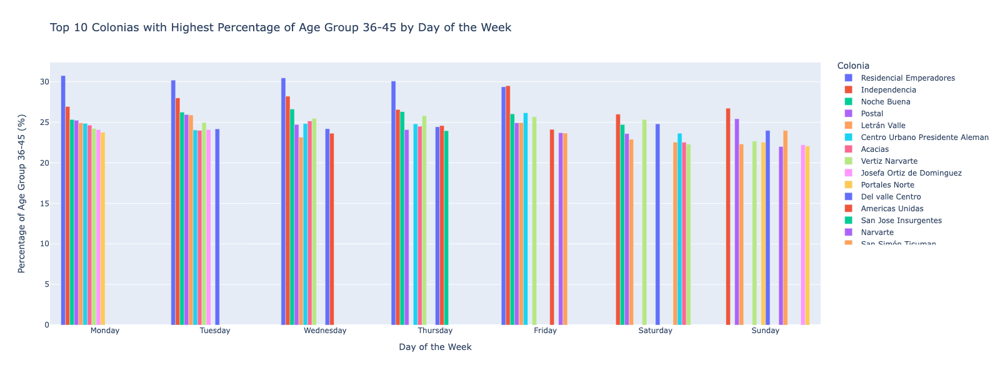

## Residencial Emperadores leads from Monday to Thursday for the 36-45 age group 
## while Independencia leads from Friday to Sunday.

In [ ]:
# Filter the data for the age group 46-60
age_group_16_25_data = benito_juarez_data[benito_juarez_data['Age_Group'] == '16-25']

# Calculate the total trips for each colonia per day of the week
total_trips_per_colonia_day = benito_juarez_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Total_Trips')

# Calculate the trips for the age group 46-60 for each colonia per day of the week
age_group_trips_per_colonia_day = age_group_16_25_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Age_Group_Trips')

# Merge the dataframes to get total trips and age group trips together
merged_data = pd.merge(age_group_trips_per_colonia_day, total_trips_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the percentage of trips for the age group 46-60
merged_data['Percentage_Age_Group_16_25'] = (merged_data['Age_Group_Trips'] / merged_data['Total_Trips']) * 100

# Identify the top 10 colonias with the highest percentage for each day
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Percentage_Age_Group_16_25')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Percentage_Age_Group_16_25', 
             color='Colonia', 
             title='Top 10 Colonias with Highest Percentage of Age Group 16-25 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Percentage_Age_Group_16_25': 'Percentage of Age Group 16-25 (%)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Percentage of Age Group 16-25 (%)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

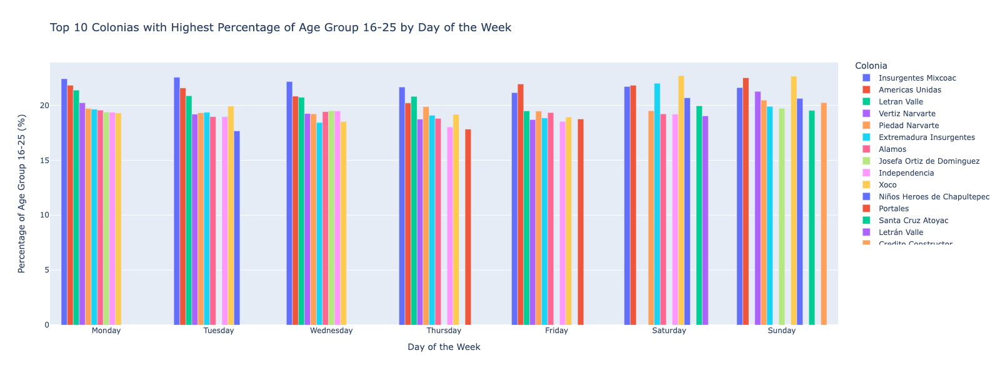

## For the 16-25 age group:
### Insurgentes Mixcoac leads from Monday to Thursday.
### Américas Unidas leads on Friday.
### Xoco is the leader on the weekend with 22%.

In [ ]:
# Filter the data for the age group 46-60
age_group_61_99_data = benito_juarez_data[benito_juarez_data['Age_Group'] == '61-99']

# Calculate the total trips for each colonia per day of the week
total_trips_per_colonia_day = benito_juarez_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Total_Trips')

# Calculate the trips for the age group 46-60 for each colonia per day of the week
age_group_trips_per_colonia_day = age_group_61_99_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Age_Group_Trips')

# Merge the dataframes to get total trips and age group trips together
merged_data = pd.merge(age_group_trips_per_colonia_day, total_trips_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the percentage of trips for the age group 46-60
merged_data['Percentage_Age_Group_61_99'] = (merged_data['Age_Group_Trips'] / merged_data['Total_Trips']) * 100

# Identify the top 10 colonias with the highest percentage for each day
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Percentage_Age_Group_61_99')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Percentage_Age_Group_61_99', 
             color='Colonia', 
             title='Top 10 Colonias with Highest Percentage of Age Group 61-99 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Percentage_Age_Group_61_99': 'Percentage of Age Group 61-99 (%)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Percentage of Age Group 61-99 (%)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

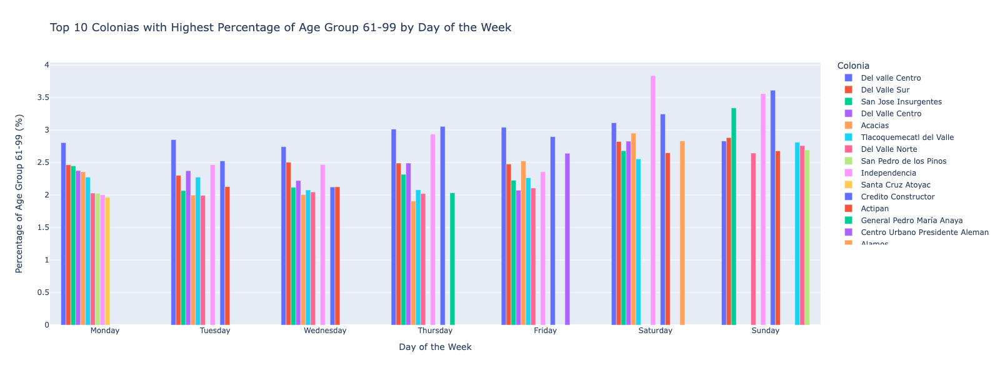

## The 61-99 age group, which is the smallest contributor, shows increasing usage as the week progresses:
### Independencia has the highest percentage on Saturday (3.8%).
### On Sunday, San José Insurgentes, Independencia, and Credito Constructor have the highest percentages.

In [ ]:
# Filter the data for the age group 61-99
age_group_61_99_data = benito_juarez_data[benito_juarez_data['Age_Group'] == '61-99']

# Calculate the total trips and total duration for each colonia per day of the week
total_trips_duration_per_colonia_day = benito_juarez_data.groupby(['Colonia', 'Week_Day'])['Trip_Duration'].agg(['count', 'sum']).reset_index()
total_trips_duration_per_colonia_day.columns = ['Colonia', 'Week_Day', 'Total_Trips', 'Total_Duration']

# Calculate the total duration for the age group 61-99 for each colonia per day of the week
age_group_duration_per_colonia_day = age_group_61_99_data.groupby(['Colonia', 'Week_Day'])['Trip_Duration'].agg(['count', 'sum']).reset_index()
age_group_duration_per_colonia_day.columns = ['Colonia', 'Week_Day', 'Age_Group_Trips', 'Age_Group_Duration']

# Merge the dataframes to get total duration and age group duration together
merged_data = pd.merge(age_group_duration_per_colonia_day, total_trips_duration_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the average trip duration for the age group 61-99
merged_data['Avg_Trip_Duration_61_99'] = merged_data['Age_Group_Duration'] / merged_data['Age_Group_Trips']

# Identify the top 10 colonias with the highest average trip duration for the age group 61-99
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Avg_Trip_Duration_61_99')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Avg_Trip_Duration_61_99', 
             color='Colonia', 
             title='Top 10 Colonias with Highest Average Trip Duration of Age Group 61-99 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Avg_Trip_Duration_61_99': 'Average Trip Duration (minutes)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Average Trip Duration (minutes)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

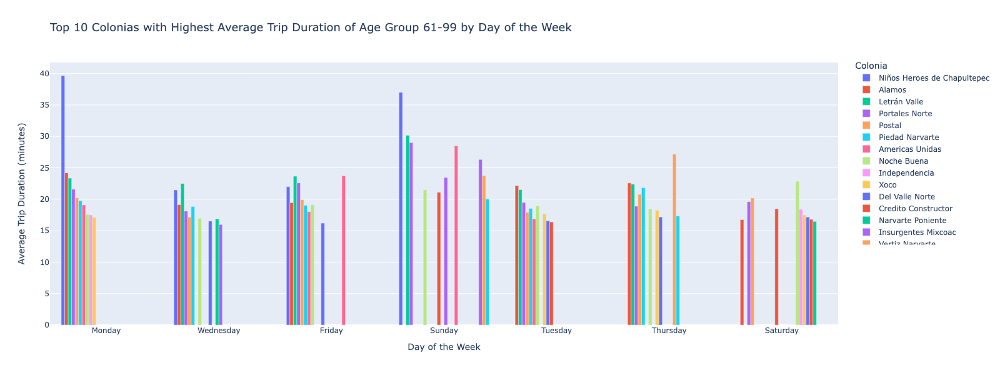

### Niños Heroes de Chapultepec is most active on Sundays and Mondays in terms of trip durations. 
### Vertiz Narvarte has the highest trip duration on Thursday, while Residencial Emperadores stands out on Friday and Sunday.
### The 61-99 age group does not follow the overall trend seen in other age groups, where trip durations start low at the beginning of the week and increase as the week progresses. 
### Instead, this age group shows higher durations on weekends compared to weekdays.

In [ ]:
# Filter the data for the age group 61-99
age_group_16_25_data = benito_juarez_data[benito_juarez_data['Age_Group'] == '16-25']

# Calculate the total trips and total duration for each colonia per day of the week
total_trips_duration_per_colonia_day = benito_juarez_data.groupby(['Colonia', 'Week_Day'])['Trip_Duration'].agg(['count', 'sum']).reset_index()
total_trips_duration_per_colonia_day.columns = ['Colonia', 'Week_Day', 'Total_Trips', 'Total_Duration']

# Calculate the total duration for the age group 61-99 for each colonia per day of the week
age_group_duration_per_colonia_day = age_group_16_25_data.groupby(['Colonia', 'Week_Day'])['Trip_Duration'].agg(['count', 'sum']).reset_index()
age_group_duration_per_colonia_day.columns = ['Colonia', 'Week_Day', 'Age_Group_Trips', 'Age_Group_Duration']

# Merge the dataframes to get total duration and age group duration together
merged_data = pd.merge(age_group_duration_per_colonia_day, total_trips_duration_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the average trip duration for the age group 61-99
merged_data['Avg_Trip_Duration_16_25'] = merged_data['Age_Group_Duration'] / merged_data['Age_Group_Trips']

# Identify the top 10 colonias with the highest average trip duration for the age group 61-99
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Avg_Trip_Duration_16_25')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Avg_Trip_Duration_16_25', 
             color='Colonia', 
             title='Top 10 Colonias with Highest Average Trip Duration of Age Group 16-25 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Avg_Trip_Duration_16_25': 'Average Trip Duration (minutes)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Average Trip Duration (minutes)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

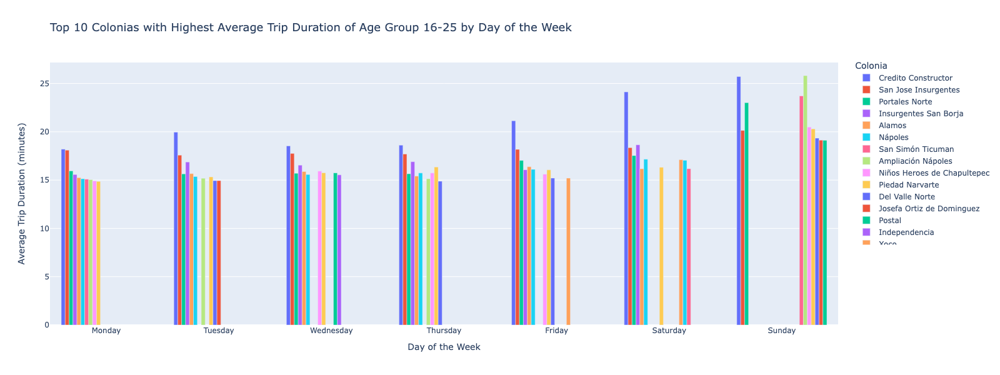

### Credito Constructor leads every day except Sunday. 
### On Sunday, Residencial Emperadores, Portales Norte, and Letrán Valle are also notable. 
### This age group shows similar behavior to the 16-25 group, with Credito Constructor leading every day except Sunday.

In [ ]:
# Filter the data for the age group 61-99
age_group_26_35_data = benito_juarez_data[benito_juarez_data['Age_Group'] == '26-35']

# Calculate the total trips and total duration for each colonia per day of the week
total_trips_duration_per_colonia_day = benito_juarez_data.groupby(['Colonia', 'Week_Day'])['Trip_Duration'].agg(['count', 'sum']).reset_index()
total_trips_duration_per_colonia_day.columns = ['Colonia', 'Week_Day', 'Total_Trips', 'Total_Duration']

# Calculate the total duration for the age group 61-99 for each colonia per day of the week
age_group_duration_per_colonia_day = age_group_26_35_data.groupby(['Colonia', 'Week_Day'])['Trip_Duration'].agg(['count', 'sum']).reset_index()
age_group_duration_per_colonia_day.columns = ['Colonia', 'Week_Day', 'Age_Group_Trips', 'Age_Group_Duration']

# Merge the dataframes to get total duration and age group duration together
merged_data = pd.merge(age_group_duration_per_colonia_day, total_trips_duration_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the average trip duration for the age group 61-99
merged_data['Avg_Trip_Duration_26_35'] = merged_data['Age_Group_Duration'] / merged_data['Age_Group_Trips']

# Identify the top 10 colonias with the highest average trip duration for the age group 61-99
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Avg_Trip_Duration_26_35')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Avg_Trip_Duration_26_35', 
             color='Colonia', 
             title='Top 10 Colonias with Highest Average Trip Duration of Age Group 26-35 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Avg_Trip_Duration_26_35': 'Average Trip Duration (minutes)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Average Trip Duration (minutes)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

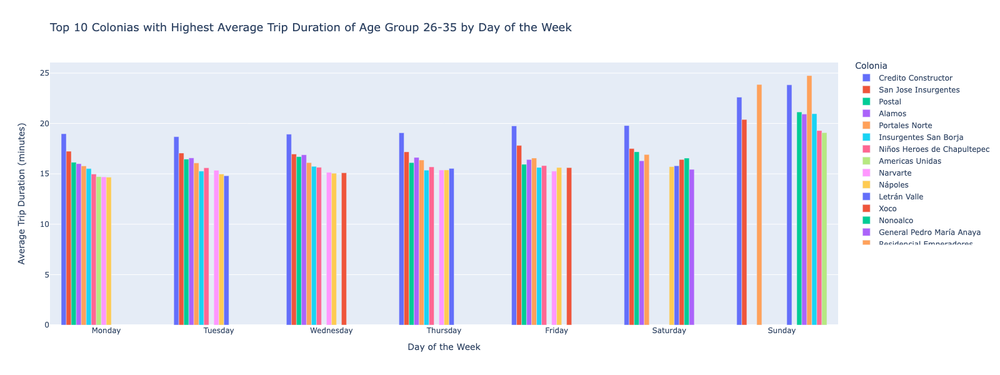

### This age group exhibits behavior similar to the previous group (16-25). 
### Credito Constructor leads every day except Sunday. 
### On Sundays, Residencial Emperadores, Portales Norte, and Letrán Valle stand out.

In [ ]:
# Filter the data for the age group 61-99
age_group_36_45_data = benito_juarez_data[benito_juarez_data['Age_Group'] == '36-45']

# Calculate the total trips and total duration for each colonia per day of the week
total_trips_duration_per_colonia_day = benito_juarez_data.groupby(['Colonia', 'Week_Day'])['Trip_Duration'].agg(['count', 'sum']).reset_index()
total_trips_duration_per_colonia_day.columns = ['Colonia', 'Week_Day', 'Total_Trips', 'Total_Duration']

# Calculate the total duration for the age group 61-99 for each colonia per day of the week
age_group_duration_per_colonia_day = age_group_36_45_data.groupby(['Colonia', 'Week_Day'])['Trip_Duration'].agg(['count', 'sum']).reset_index()
age_group_duration_per_colonia_day.columns = ['Colonia', 'Week_Day', 'Age_Group_Trips', 'Age_Group_Duration']

# Merge the dataframes to get total duration and age group duration together
merged_data = pd.merge(age_group_duration_per_colonia_day, total_trips_duration_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the average trip duration for the age group 61-99
merged_data['Avg_Trip_Duration_36_45'] = merged_data['Age_Group_Duration'] / merged_data['Age_Group_Trips']

# Identify the top 10 colonias with the highest average trip duration for the age group 61-99
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Avg_Trip_Duration_36_45')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Avg_Trip_Duration_36_45', 
             color='Colonia', 
             title='Top 10 Colonias with Highest Average Trip Duration of Age Group 36-45 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Avg_Trip_Duration_36_45': 'Average Trip Duration (minutes)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Average Trip Duration (minutes)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

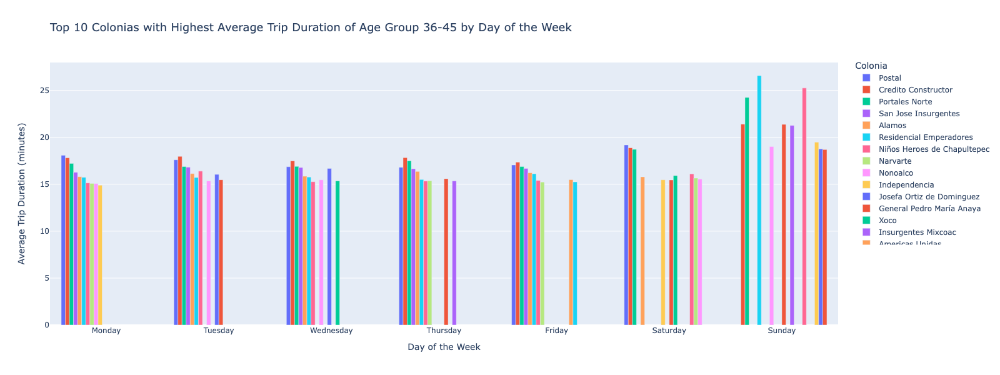

### For the week, Postal and Credito Constructor lead, with Portales Norte also worth noting (36-45).
### On Sundays, Residencial Emperadores leads, followed by Letrán Valle and Portales Norte.

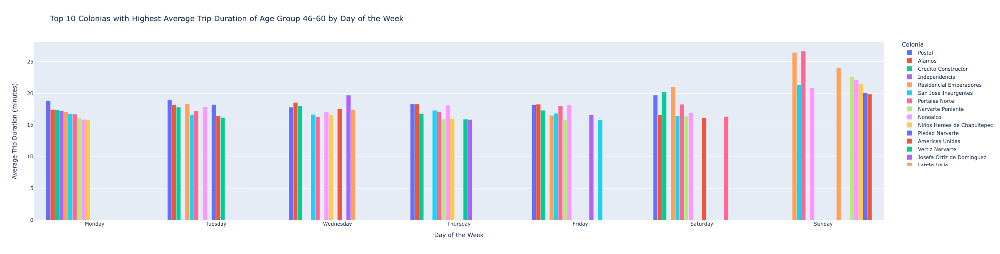

In [349]:
# Filter the data for the age group 61-99
age_group_46_60_data = benito_juarez_data[benito_juarez_data['Age_Group'] == '46-60']

# Calculate the total trips and total duration for each colonia per day of the week
total_trips_duration_per_colonia_day = benito_juarez_data.groupby(['Colonia', 'Week_Day'])['Trip_Duration'].agg(['count', 'sum']).reset_index()
total_trips_duration_per_colonia_day.columns = ['Colonia', 'Week_Day', 'Total_Trips', 'Total_Duration']

# Calculate the total duration for the age group 61-99 for each colonia per day of the week
age_group_duration_per_colonia_day = age_group_46_60_data.groupby(['Colonia', 'Week_Day'])['Trip_Duration'].agg(['count', 'sum']).reset_index()
age_group_duration_per_colonia_day.columns = ['Colonia', 'Week_Day', 'Age_Group_Trips', 'Age_Group_Duration']

# Merge the dataframes to get total duration and age group duration together
merged_data = pd.merge(age_group_duration_per_colonia_day, total_trips_duration_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the average trip duration for the age group 61-99
merged_data['Avg_Trip_Duration_46_60'] = merged_data['Age_Group_Duration'] / merged_data['Age_Group_Trips']

# Identify the top 10 colonias with the highest average trip duration for the age group 61-99
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Avg_Trip_Duration_46_60')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Avg_Trip_Duration_46_60', 
             color='Colonia', 
             title='Top 10 Colonias with Highest Average Trip Duration of Age Group 46-60 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Avg_Trip_Duration_46_60': 'Average Trip Duration (minutes)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Average Trip Duration (minutes)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

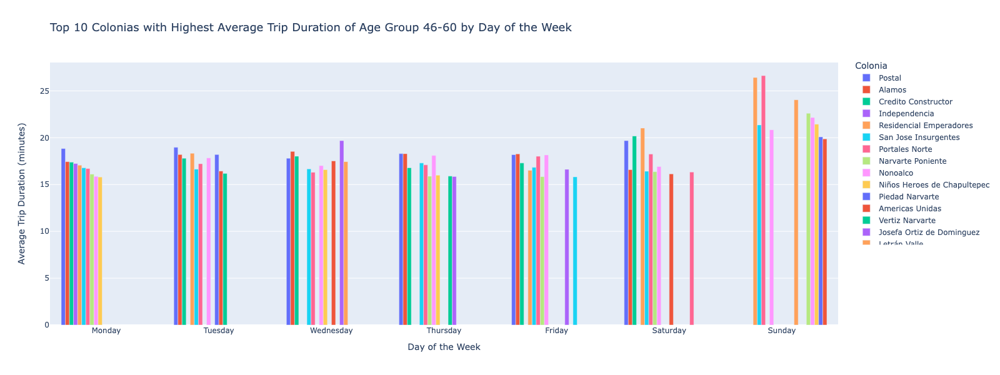

### For the week, Postal and Credito Constructor lead, with Portales Norte also worth noting. 
### On Saturday, Residencial Emperadores leads, followed by Credito Constructor.
### For weekdays, notable colonias include Postal, Álamos, Josefa Ortiz de Domínguez, and Nonoalco while Residencial Emperadores, Portales Norte, and Letrán Valle are prominent on Sundays.

# Hourly statistics

In [351]:
benito_juarez_data.groupby(['Hour', 'Colonia']).size().reset_index(name='Trip_Count')

,Hour,Colonia,Trip_Count
0,0,Acacias,171
1,0,Actipan,515
2,0,Alamos,277
3,0,Americas Unidas,81
4,0,Ampliación Nápoles,292
...,...,...,...
778,23,San Simón Ticuman,330
779,23,Santa Cruz Atoyac,2565
780,23,Tlacoquemecatl del Valle,1941
781,23,Vertiz Narvarte,718


In [ ]:
# Group by 'Hour' and 'Colonia' and count the number of trips
trip_count_per_hour_colonia = benito_juarez_data.groupby(['Hour', 'Colonia']).size().reset_index(name='Trip_Count')

# Get the top 10 colonias for each hour by trip count
top_10_colonias_per_hour = trip_count_per_hour_colonia.groupby('Hour').apply(lambda x: x.nlargest(10, 'Trip_Count')).reset_index(drop=True)

# Create a bar chart
fig = px.bar(top_10_colonias_per_hour, x='Hour', y='Trip_Count', color='Colonia', barmode='group',
             title='Top 10 Colonias by Number of Trips per Hour in Benito Juárez',
             labels={'Hour': 'Hour of the Day', 'Trip_Count': 'Number of Trips', 'Colonia': 'Colonia'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Hour of the Day',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Update x-axis ticks to show all hours from 0 to 23
fig.update_xaxes(tickmode='array', tickvals=list(range(24)))

# Show the plot
fig.show()

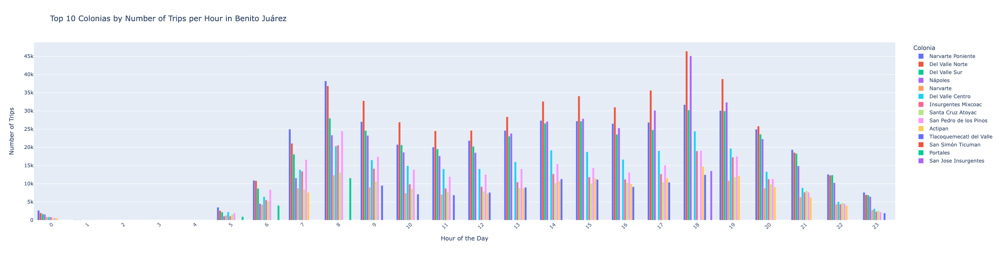

### Top busiest colonias by hour for morning commutes are Narvarte Poniente, Del Valle Norte, Del Valle Sur, San Pedro de los Pinos, and Napoles.
### Activity in Napoles increases around 1 p.m., as does Del Valle Centro.
### During the peak after-work rush hour, Napoles and Del Valle Norte are the busiest colonias.

In [ ]:
# Extract the unique colonias from the top 10 lists
top_colonias = top_10_colonias_per_hour['Colonia'].unique()

# Filter the original data to include only the top colonias
filtered_data = benito_juarez_data[benito_juarez_data['Colonia'].isin(top_colonias)]

# Group by 'Station_ID' and count the number of trips for each station
trip_count_per_station = filtered_data.groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude']).size().reset_index(name='Trip_Count')

# Sort the stations by trip count in descending order and select the top 15
top_15_stations = trip_count_per_station.sort_values(by='Trip_Count', ascending=False).head(15)

# Generate a color map for the top 15 stations
colors = plt.cm.get_cmap('tab20', 15).colors  # 'tab20' is a colormap with 20 colors
color_map = {station: colors[i] for i, station in enumerate(top_15_stations['Station_ID'])}
color_map_hex = {station: mcolors.rgb2hex(color) for station, color in color_map.items()}

# Create a Folium map centered at the mean latitude and longitude of the top 15 stations
mean_lat_lon = top_15_stations[['Latitude', 'Longitude']].mean()
map_center = [mean_lat_lon['Latitude'], mean_lat_lon['Longitude']]
mymap = folium.Map(location=map_center, zoom_start=14)

# Extract coordinates for all unique stations in Miguel Hidalgo data
coords = benito_juarez_data[['Latitude', 'Longitude']].drop_duplicates().values

# Compute the convex hull for all unique stations
hull = ConvexHull(coords)
hull_coords = [coords[vertex].tolist() for vertex in hull.vertices] + [coords[hull.vertices[0]].tolist()]

# Add a polygon layer for the Miguel Hidalgo boundary
folium.Polygon(
    locations=hull_coords,
    color='blue',
    fill=True,
    fill_opacity=0.2,
    weight=2,
    popup='Benito Juarez Area'
).add_to(mymap)

# Add a marker for each of the top 15 stations with color based on Station_ID
for idx, row in top_15_stations.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {row['Station_ID']}<br>Colonia: {row['Colonia']}<br>Trip Count: {row['Trip_Count']}",
        icon=folium.Icon(color='blue', icon_color=color_map_hex[row['Station_ID']])
    ).add_to(mymap)

# Add a title to the map
title_html = '''
     <div style="position: fixed; 
     top: 10px; left: 60%; transform: translateX(-50%); width: auto; height: auto; 
     background-color: white; z-index:9999; font-size:22px;
     border:2px solid grey; border-radius: 10px; padding: 5px;">
     <b>Top 15 Stations hourly with Highest Trip Counts in Benito Juarez</b>
     </div>
     '''
mymap.get_root().html.add_child(folium.Element(title_html))

# Create a legend for top 15 stations
legend_html = '''
     <div style="position: absolute; 
     top: 50px; left: 50px; width: 380px; height: 400px; 
     background-color: white; z-index:9999; font-size:16px;
     border:2px solid grey; border-radius: 10px; padding: 16px;">
     <b>Top 15 Stations by Trip Count</b><br>
     '''
for idx, row in top_15_stations.iterrows():
    legend_html += f'<i style="background:{color_map_hex[row["Station_ID"]]}; width: 10px; height: 10px; display: inline-block;"></i> Station {row["Station_ID"]}: {row["Colonia"]}<br>'
legend_html += '</div>'

mymap.get_root().html.add_child(folium.Element(legend_html))

# Display the map
mymap


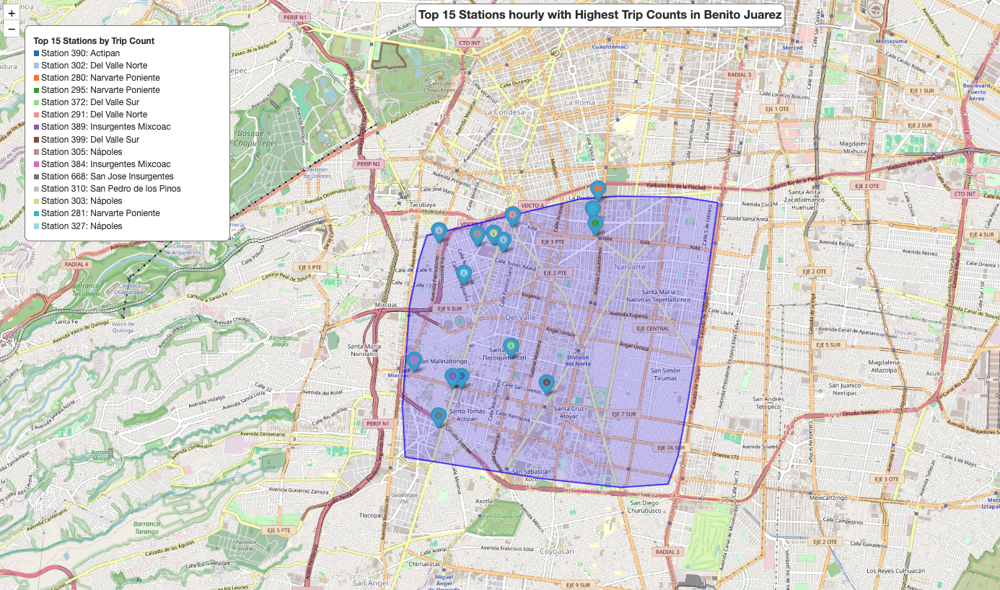

### Top hourly stations are found west of avenida cuauhtemoc
### 6 are found on avenida insurgentes

In [ ]:
# Filter the data to include only female users
female_data = benito_juarez_data[benito_juarez_data['Gender'] == 'F']

# Group by 'Hour' and 'Colonia' and count the number of trips
trip_count_per_hour_colonia_female = female_data.groupby(['Hour', 'Colonia']).size().reset_index(name='Trip_Count')

# Get the top 3 colonias for each hour by trip count
top_3_colonias_per_hour = trip_count_per_hour_colonia_female.groupby('Hour').apply(lambda x: x.nlargest(3, 'Trip_Count')).reset_index(drop=True)

# Create a bar chart to visualize the number of trips by hour and colonia
fig = px.bar(top_3_colonias_per_hour, x='Hour', y='Trip_Count', color='Colonia', barmode='group',
             title='Top 3 Colonias with the Highest Number of Female Users per Hour in Benito Juárez',
             labels={'Hour': 'Hour of the Day', 'Trip_Count': 'Number of Trips', 'Colonia': 'Colonia'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Hour of the Day',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Update x-axis ticks to show all hours from 0 to 23
fig.update_xaxes(tickmode='array', tickvals=list(range(24)))

# Show the plot
fig.show()

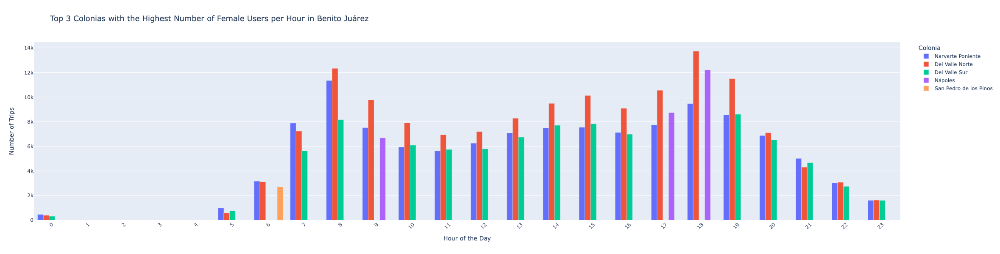

### Above are the top 3 colonias each hour for Females
### Napoles has top activity at 9am and 17 and 18
### All other hours consist of Narvarte Poniente, Del Valle Norte, Del Valle Sur

In [ ]:
# Group by 'Hour' and 'Colonia' and calculate the average trip duration
avg_trip_duration_per_hour_colonia_female = female_data.groupby(['Hour', 'Colonia'])['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')

# Get the colonia with the highest average trip duration for each hour
max_female_avg_trip_duration_per_hour = avg_trip_duration_per_hour_colonia_female.loc[avg_trip_duration_per_hour_colonia_female.groupby('Hour')['Avg_Trip_Duration'].idxmax()]

# Create a bar chart to visualize the average trip duration by hour and colonia
fig = px.bar(max_female_avg_trip_duration_per_hour, x='Hour', y='Avg_Trip_Duration', color='Colonia', barmode='group',
             title='Colonias with the Highest Average Trip Duration for Female Users per Hour in Benito Juárez',
             labels={'Hour': 'Hour of the Day', 'Avg_Trip_Duration': 'Average Trip Duration (minutes)', 'Colonia': 'Colonia'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Hour of the Day',
    yaxis_title='Average Trip Duration (minutes)',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600 # Set the height of the chart
)

# Update x-axis ticks to show all hours from 0 to 23
fig.update_xaxes(tickmode='array', tickvals=list(range(24)))

# Show the plot
fig.show()

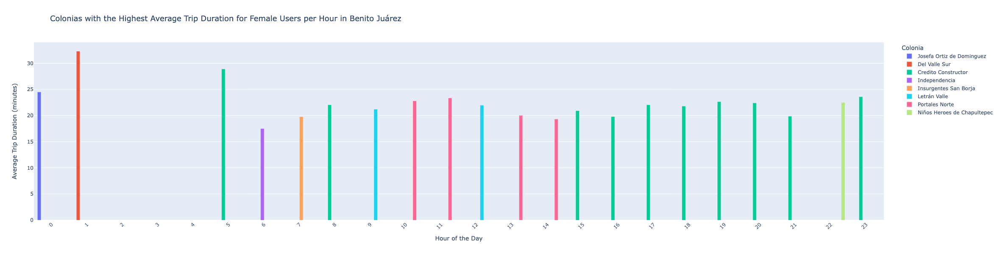

### Credito Constructor and Portales Norte and Letran Valle show the most usage for long trip durations for females 

In [ ]:
# Group by 'Hour' and 'Colonia' and count the number of trips
trip_count_per_hour_colonia_age_group = age_group_16_25_data.groupby(['Hour', 'Colonia']).size().reset_index(name='Trip_Count')

# Get the top 3 colonias for each hour by trip count
top_3_colonias_per_hour_age_group = trip_count_per_hour_colonia_age_group.groupby('Hour').apply(lambda x: x.nlargest(3, 'Trip_Count')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_3_colonias_per_hour_age_group, 
             x='Hour', 
             y='Trip_Count', 
             color='Colonia', 
             title='Top 3 Colonias with the Most Trips Taken by Users (Age 16-25) per Hour in Benito Juárez',
             labels={'Hour': 'Hour of the Day', 'Trip_Count': 'Number of Trips', 'Colonia': 'Colonia'},
             barmode='group')

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Hour of the Day',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600,  # Set the height of the chart
    bargap=0.15,  # Adjust the gap between bars for better visualization
    bargroupgap=0.1  # Adjust the gap between groups of bars
)

# Update x-axis ticks to show all hours from 0 to 23
fig.update_xaxes(tickmode='array', tickvals=list(range(24)))

# Show the plot
fig.show()

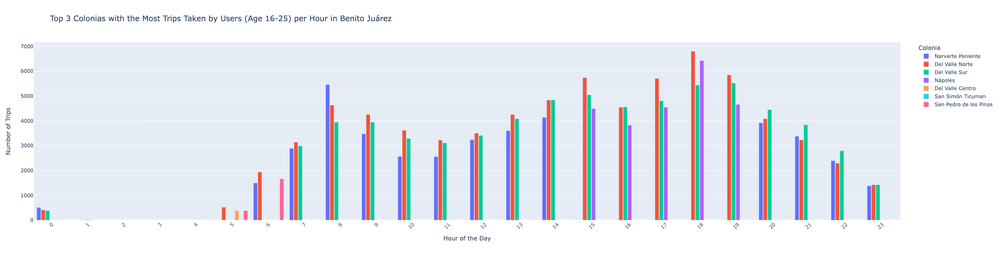

### Activity for napoles starts at 15:00 for age group 16-25
### Del valle Sur, Narvarte Poniente and Del Valle Norte are the colonias with the most trips taken hourly for age group 16-25
### 6pm shows the most trips taken for Napoles and Del Valle Norte

In [ ]:
# Group by 'Hour' and 'Colonia' and count the number of trips
trip_count_per_hour_colonia_age_group = age_group_26_35_data.groupby(['Hour', 'Colonia']).size().reset_index(name='Trip_Count')

# Get the top 3 colonias for each hour by trip count
top_3_colonias_per_hour_age_group = trip_count_per_hour_colonia_age_group.groupby('Hour').apply(lambda x: x.nlargest(3, 'Trip_Count')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_3_colonias_per_hour_age_group, 
             x='Hour', 
             y='Trip_Count', 
             color='Colonia', 
             title='Top 3 Colonias with the Most Trips Taken by Users (Age 26-35) per Hour in Benito Juárez',
             labels={'Hour': 'Hour of the Day', 'Trip_Count': 'Number of Trips', 'Colonia': 'Colonia'},
             barmode='group')

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Hour of the Day',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600,  # Set the height of the chart
    bargap=0.15,  # Adjust the gap between bars for better visualization
    bargroupgap=0.1  # Adjust the gap between groups of bars
)

# Update x-axis ticks to show all hours from 0 to 23
fig.update_xaxes(tickmode='array', tickvals=list(range(24)))

# Show the plot
fig.show()

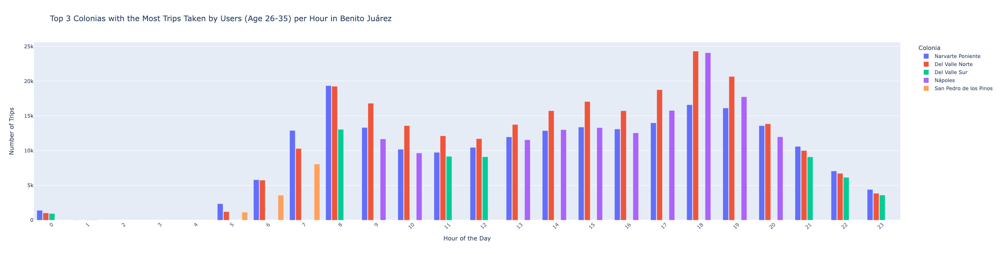

### For 26-35 age group, Napoles shows high trips taken at 9am all throughout 20:00 opposed to age group 16-25
### 18:00 records the most trips for Napoles and del Valle Norte

In [ ]:
# Group by 'Hour' and 'Colonia' and count the number of trips
trip_count_per_hour_colonia_age_group = age_group_36_45_data.groupby(['Hour', 'Colonia']).size().reset_index(name='Trip_Count')

# Get the top 3 colonias for each hour by trip count
top_3_colonias_per_hour_age_group = trip_count_per_hour_colonia_age_group.groupby('Hour').apply(lambda x: x.nlargest(3, 'Trip_Count')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_3_colonias_per_hour_age_group, 
             x='Hour', 
             y='Trip_Count', 
             color='Colonia', 
             title='Top 3 Colonias with the Most Trips Taken by Users (Age 36-45) per Hour in Benito Juárez',
             labels={'Hour': 'Hour of the Day', 'Trip_Count': 'Number of Trips', 'Colonia': 'Colonia'},
             barmode='group')

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Hour of the Day',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600,  # Set the height of the chart
    bargap=0.15,  # Adjust the gap between bars for better visualization
    bargroupgap=0.1  # Adjust the gap between groups of bars
)

# Update x-axis ticks to show all hours from 0 to 23
fig.update_xaxes(tickmode='array', tickvals=list(range(24)))

# Show the plot
fig.show()

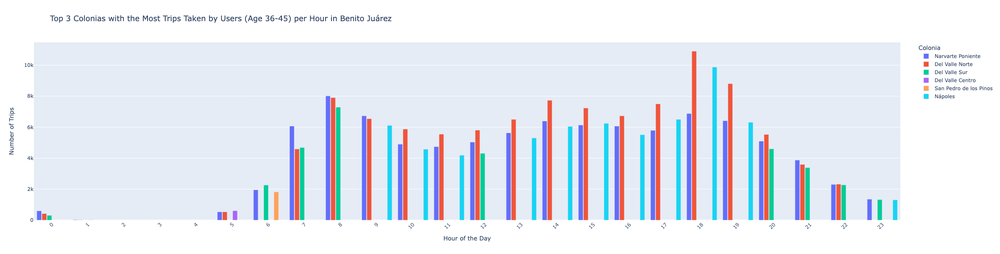

### Napoles does not stand out as the top colonia for age group 36-45 for 18:00
### Del Valle Norte continues to be the colonia with the most trips hourly with the most at 18:00

In [ ]:
# Group by 'Hour' and 'Colonia' and count the number of trips
trip_count_per_hour_colonia_age_group = age_group_46_60_data.groupby(['Hour', 'Colonia']).size().reset_index(name='Trip_Count')

# Get the top 3 colonias for each hour by trip count
top_3_colonias_per_hour_age_group = trip_count_per_hour_colonia_age_group.groupby('Hour').apply(lambda x: x.nlargest(3, 'Trip_Count')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_3_colonias_per_hour_age_group, 
             x='Hour', 
             y='Trip_Count', 
             color='Colonia', 
             title='Top 3 Colonias with the Most Trips Taken by Users (Age 46-60) per Hour in Benito Juárez',
             labels={'Hour': 'Hour of the Day', 'Trip_Count': 'Number of Trips', 'Colonia': 'Colonia'},
             barmode='group')

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Hour of the Day',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600,  # Set the height of the chart
    bargap=0.15,  # Adjust the gap between bars for better visualization
    bargroupgap=0.1  # Adjust the gap between groups of bars
)

# Update x-axis ticks to show all hours from 0 to 23
fig.update_xaxes(tickmode='array', tickvals=list(range(24)))

# Show the plot
fig.show()

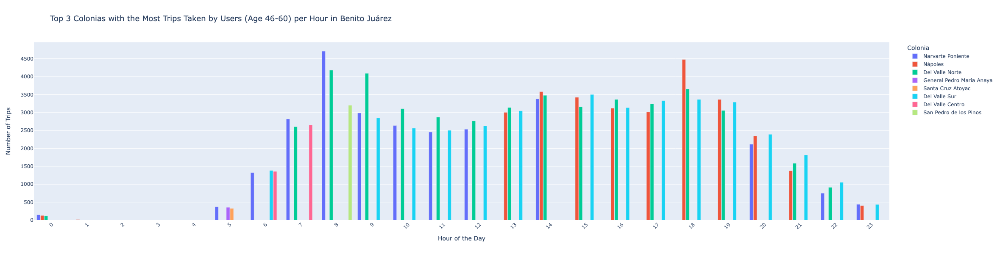

### Napoles is not that popular for age group 46-60 until 13:00
### Narvarte poniente stands out as the busiest colonia at 8am
## Napoles records the second busiest hour at 18:00

In [ ]:
# Group by 'Hour' and 'Colonia' and count the number of trips
trip_count_per_hour_colonia_age_group = age_group_61_99_data.groupby(['Hour', 'Colonia']).size().reset_index(name='Trip_Count')

# Get the top 3 colonias for each hour by trip count
top_3_colonias_per_hour_age_group = trip_count_per_hour_colonia_age_group.groupby('Hour').apply(lambda x: x.nlargest(3, 'Trip_Count')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_3_colonias_per_hour_age_group, 
             x='Hour', 
             y='Trip_Count', 
             color='Colonia', 
             title='Top 3 Colonias with the Most Trips Taken by Users (Age 61-99) per Hour in Benito Juárez',
             labels={'Hour': 'Hour of the Day', 'Trip_Count': 'Number of Trips', 'Colonia': 'Colonia'},
             barmode='group')

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Hour of the Day',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600,  # Set the height of the chart
    bargap=0.15,  # Adjust the gap between bars for better visualization
    bargroupgap=0.1  # Adjust the gap between groups of bars
)

# Update x-axis ticks to show all hours from 0 to 23
fig.update_xaxes(tickmode='array', tickvals=list(range(24)))

# Show the plot
fig.show()

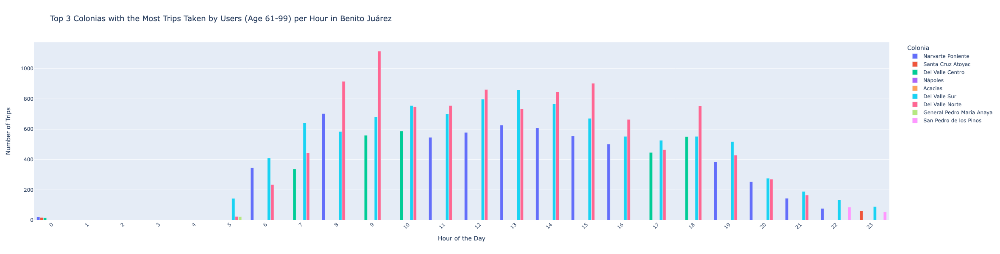

### Napoles is not prefered at all for the oldest age group 61-99
### This age group records the busiest hours between 8-9am for colonia Del Valle Norte

# Summary of Findings
## Top Colonias for Trip Count and Duration:

### - Del Valle Norte leads in average trip count from Monday to Friday, followed by Del Valle Sur, Narvarte Poniente, and Napoles.
### - Wednesday sees the highest number of trips.
### - Narvarte Poniente leads during the weekend.
### - Credito Constructor maintains the highest average trip duration from Monday to Friday.
### - Residencial Emperadores, Portales Norte, and Letran Valle have the highest trip durations on Sunday.

## Location and Demographics:
    
### - Colonias with the highest trip durations are often on the Alcaldia's limits and near major belt lines, facilitating easier commutes via main avenues.
### - Colonias with high trip durations often overlap with those having high female percentages.

## Gender and Age Group Analysis:

### - Credito Constructor has the highest trip duration but the lowest female percentage (25.5%).
### - Alamos has a 31% female percentage and high trip duration on weekdays, with a drop on weekends.
### - Portales Norte and Letran Valle maintain top trip durations on Sunday with 32% female riders.
### - Age Group 46-60 consistently leads in average trip duration, with Age Group 61-99 having significant durations but dropping on Fridays and Saturdays.
### - Age Group 16-25 has the lowest average trip durations.

## Age Group Distribution:

### - Credito Constructor has the highest percentage of riders aged 61-99.
### - Residencial Emperadores has the highest percentage of riders aged 36-45.
### - For age group 26-35, significant colonias include San Borja, General Pedro Maria Anaya, Xoco, and Credito Constructor on weekdays.
### - Pedregal Narvarte, San Borja, and Centro Urbano Presidente Aleman stand out on specific days.

# Targeted Marketing Strategies
## Credito Constructor:

### - Focus on marketing to older adults (61-99) and middle-aged riders (36-45).
### - Promote activities and services that cater to longer trip durations.
### Highlight convenience for commutes via main avenues.
### - Residencial Emperadores, Portales Norte, and Letran Valle:

### - Tailor marketing campaigns for weekends, especially targeting older adults.
### - Offer weekend-specific promotions or events.
### - Enhance services that cater to high trip durations.
## Narvarte Poniente:

### - Promote weekend activities, as it leads in trip counts during weekends.
### - Develop community events or initiatives that encourage increased usage on weekends.
## Del Valle Norte and Del Valle Sur:

### - Target young professionals (26-35) and offer weekday commuter promotions.
### - Enhance services that support high trip counts on weekdays.
### - Consider partnerships with local businesses for weekday commuters.
## General Marketing Tips:

### - Utilize demographic data to tailor communication and promotional materials.
### - Highlight safety, convenience, and community benefits to encourage higher participation.
### - Collaborate with local businesses and organizations to create value-added services for riders.